In [ ]:
## Import neccessary packages
import os
import cv2
import random
import warnings
import argparse
import itertools
import numpy as np
from imutils import paths
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
from tqdm import tqdm_notebook as tqdm

# import the tensorflow.keras packages
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix , accuracy_score, classification_report

SEED = 50

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# create CNN Model(Yann LeCun et al:1998)

class LeNet:
    @staticmethod
    def build(width, height, depth, classes):
        # initialize the model
        model = Sequential()                ## siamese networks
        inputShape = (height, width, depth)

        # if we are using "channels first", update the input shape
        print(K.image_data_format())
        if K.image_data_format() == "channels_first":
            inputShape = (depth, height, width)

        # first set of CONV => RELU => POOL layers
        model.add(Conv2D(20, (5, 5), padding="same",input_shape=inputShape))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # second set of CONV => RELU => POOL layers
        model.add(Conv2D(50, (5, 5), padding="same"))
        model.add(Activation("relu"))
        model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

        # first (and only) set of FC => RELU layers
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation("relu"))

        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation("softmax"))

        # return the constructed network architecture
        return model

In [ ]:
DATASET = "/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train"  # this folder must contain three subfolder with images
MODEL = "/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/Scene.model" # name to store the model on disk
PLOT = "plot.png" # plot name

In [ ]:
list(paths.list_images(DATASET))[:5]

['/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/1001.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/1012.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/0.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/1009.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/1045.jpg']

In [ ]:
imagePaths = sorted(list(paths.list_images(DATASET)))
random.seed(SEED)
random.shuffle(imagePaths)
imagePaths[:5]

['/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Sea/3840.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Forest/1369.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Sea/3691.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/1891.jpg',
 '/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Sea/1741.jpg']

In [ ]:
len(imagePaths)

1326

In [ ]:
imagePaths[5]

'/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/4259.jpg'

In [ ]:
image1=cv2.imread(imagePaths[5])
image1

In [ ]:
## This is the shape of one image
image=cv2.imread(imagePaths[5])
print("Shape of one image=>",image.shape)

##Resize it => deep learning models train faster on small images
image = cv2.resize(image, (28, 28))
print("Resize Shape of one image=>",image.shape)
print("Type",type(image))

##convert it to array
image = img_to_array(image)
print("Type",type(image))

Shape of one image=> (150, 150, 3)
Resize Shape of one image=> (28, 28, 3)
Type <class 'numpy.ndarray'>
Type <class 'numpy.ndarray'>


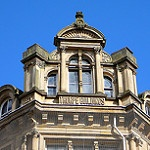

In [ ]:
from google.colab.patches import cv2_imshow
image=cv2.imread(imagePaths[5])
cv2_imshow(image)


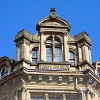

In [ ]:
image = cv2.resize(image,(100,100))
cv2_imshow(image)

In [ ]:
imagePaths[5]

'/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_Train/Buildings/4259.jpg'

In [ ]:
imagePaths[5].split("/")

['',
 'content',
 'drive',
 'MyDrive',
 'Data Science',
 'Deep Learning',
 'CNN',
 'Dataset',
 'CNN_Train',
 'Buildings',
 '4259.jpg']

In [ ]:
imagePaths[5].split("/")[-2]

'Buildings'

In [ ]:
## Extract The Label From Image Path
label = imagePaths[5].split(os.path.sep)[-2]
label

'Buildings'

In [ ]:
# initialize the data and labels
print("[INFO] loading images...")
data = []
labels = []

# grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images(DATASET)))
random.seed(SEED)
random.shuffle(imagePaths)

# progress bar
with tqdm(total=len(imagePaths)) as pbar:
    # loop over the input images
    for idx, imagePath in enumerate(imagePaths):
        # load the image, pre-process it, and store it in the data list
        image = cv2.imread(imagePath)
        image = cv2.resize(image, (28, 28))
        image = img_to_array(image)
        data.append(image)
        # extract the class label from the image path and update the
        # labels list
        label = imagePath.split(os.path.sep)[-2]

        if label == "Buildings":
            label = 0
        elif label == "Forest":
            label = 1
        elif label == "Sea":
            label = 2

        # print("pr: ", label)

        labels.append(label)

        # update the progressbar
        pbar.update(1)

[INFO] loading images...


  0%|          | 0/1326 [00:00<?, ?it/s]

In [ ]:
#pixel values are integers that range from 0 (black) to 255 (white).
data = np.array(data, dtype="float") / 255.0
labels = np.array(labels)

In [ ]:
data.shape

(1326, 28, 28, 3)

In [ ]:
data[1][27]

In [ ]:
labels

array([2, 1, 2, ..., 1, 1, 2])

In [ ]:
(trainX, testX, trainY, testY) = train_test_split(data, labels, test_size=0.25, random_state=SEED)

In [ ]:
trainX.shape

(994, 28, 28, 3)

In [ ]:
trainY.shape

(994,)

In [ ]:
trainY[1]

0

In [ ]:
trainY[2]

1

In [ ]:
trainY[4]

2

In [ ]:
trainY = to_categorical(trainY, num_classes=3)
testY = to_categorical(testY, num_classes=3)

In [ ]:
trainY[1]

array([1., 0., 0.], dtype=float32)

In [ ]:
trainY[2]

array([0., 1., 0.], dtype=float32)

In [ ]:
trainY[4]

array([0., 0., 1.], dtype=float32)

# Data Preprocessing (Augumentation)

In [ ]:
# construct the image generator for data augmentation
aug = ImageDataGenerator(rotation_range=30,
                         width_shift_range=0.1,
                         height_shift_range=0.1,
                         shear_range=0.2,
                         zoom_range=0.2,
                         horizontal_flip=True,
                         fill_mode="nearest")

In [ ]:
EPOCHS = 200
INIT_LR = 1e-3
BS = 32

In [ ]:
# initialize the model
print("[INFO] compiling model...")
model = LeNet.build(width=28, height=28, depth=3, classes=3)
opt = Adam(learning_rate=INIT_LR)
model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])
print("[INFO] model complied...")

[INFO] compiling model...
channels_last
[INFO] model complied...


In [ ]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 20)        1520      
                                                                 
 activation (Activation)     (None, 28, 28, 20)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 20)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 50)        25050     
                                                                 
 activation_1 (Activation)   (None, 14, 14, 50)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 50)         0         
 2D)                                                    

In [ ]:
# train the network
print("[INFO] training network...")
H = model.fit(x=aug.flow(trainX, trainY, batch_size=BS),
              validation_data=(testX, testY),
              steps_per_epoch=len(trainX) // BS,
              epochs=EPOCHS,
              verbose=1)

[INFO] training network...
Epoch 1/200
31/31 [==============================] - 5s 107ms/step - loss: 0.8993 - accuracy: 0.5239 - val_loss: 0.6199 - val_accuracy: 0.7651
Epoch 2/200
31/31 [==============================] - 3s 113ms/step - loss: 0.6612 - accuracy: 0.7048 - val_loss: 0.5372 - val_accuracy: 0.7922
Epoch 3/200
31/31 [==============================] - 6s 182ms/step - loss: 0.6589 - accuracy: 0.7277 - val_loss: 0.5682 - val_accuracy: 0.8012
Epoch 4/200
31/31 [==============================] - 3s 99ms/step - loss: 0.5324 - accuracy: 0.7807 - val_loss: 0.5681 - val_accuracy: 0.7922
Epoch 5/200
31/31 [==============================] - 4s 117ms/step - loss: 0.5175 - accuracy: 0.7796 - val_loss: 0.5543 - val_accuracy: 0.7560
Epoch 6/200
31/31 [==============================] - 6s 178ms/step - loss: 0.4965 - accuracy: 0.7963 - val_loss: 0.4842 - val_accuracy: 0.8102
Epoch 7/200
31/31 [==============================] - 3s 101ms/step - loss: 0.4779 - accuracy: 0.8046 - val_loss: 0.5

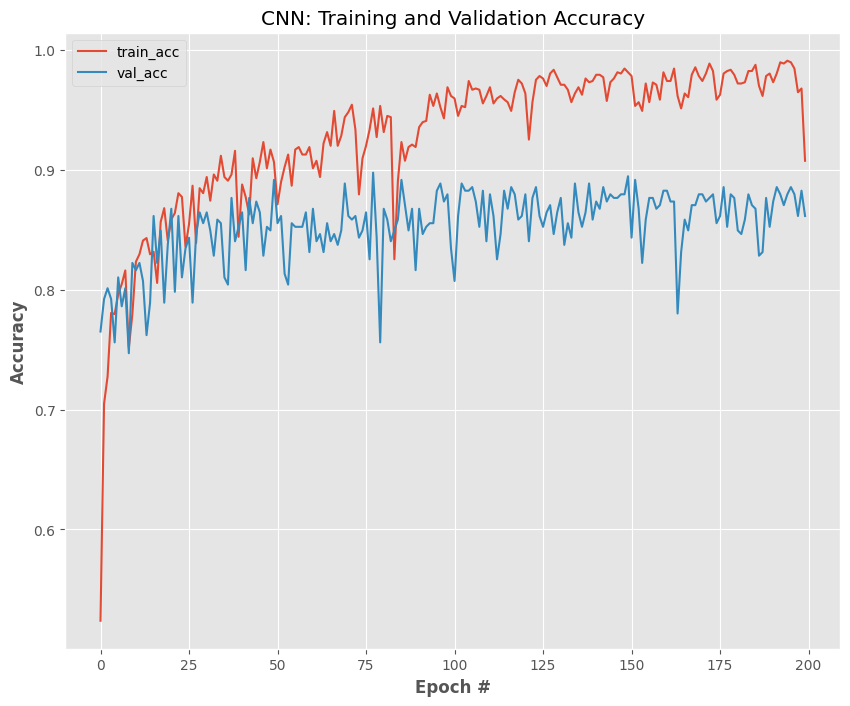

In [ ]:
# plot the training and validation accuracy
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("CNN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

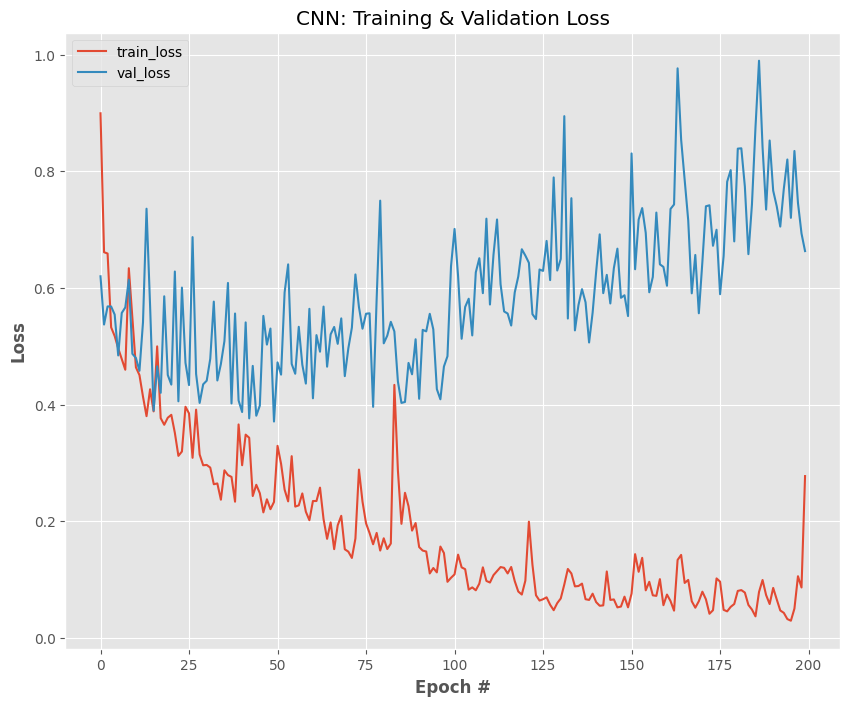

In [ ]:
# plot the training and validation loss
N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("CNN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

In [ ]:
model.save("/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/Scene_New.model")

In [ ]:
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    plt.grid()
    ax = fig.add_subplot(111)
    ax.imshow(img)

In [ ]:
from tensorflow.keras.models import load_model
import pickle
import cv2

In [ ]:
testImagePaths = sorted(list(paths.list_images('/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_test_examples')))   # data folder with 2 categorical folders
imagePath = testImagePaths[0]
print(imagePath)
image = cv2.imread(imagePath)
print(image.shape)
image = cv2.resize(image, (28, 28))
print(image.shape)
print(image[0][0])
image = image.astype("float") / 255.0
print(image[0][0])
image = img_to_array(image)
image = np.expand_dims(image, axis=0)

/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_test_examples/20072.jpg
(150, 150, 3)
(28, 28, 3)
[218 152  63]
[0.85490196 0.59607843 0.24705882]


In [ ]:
model = load_model("/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/Scene_New.model")


In [ ]:
prd_conf = model.predict(image)[0]
prd_conf

1/1 [==============================] - 0s 82ms/step


array([8.8667417e-01, 8.7513336e-06, 1.1331703e-01], dtype=float32)

In [ ]:
np.argmax(prd_conf)

0

In [ ]:
all_class = ["Buildings", "Forest", "Sea"]
label = all_class[np.argmax(prd_conf)]
label

'Buildings'

[INFO] loading network and...


  0%|          | 0/28 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


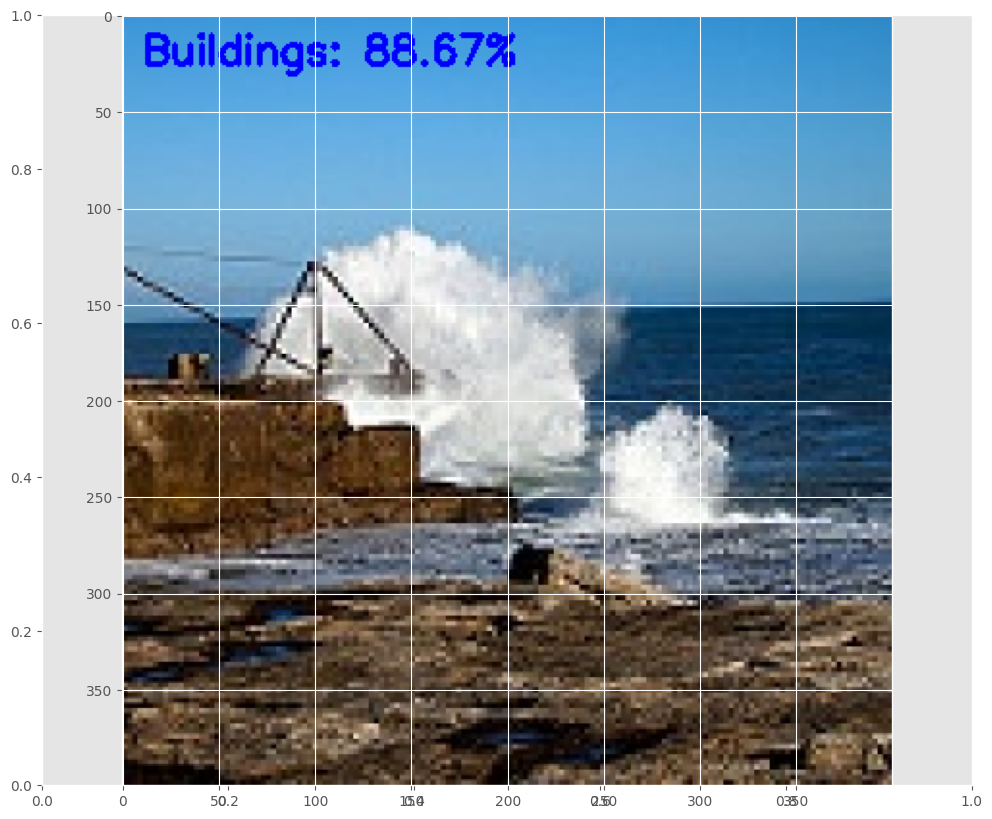

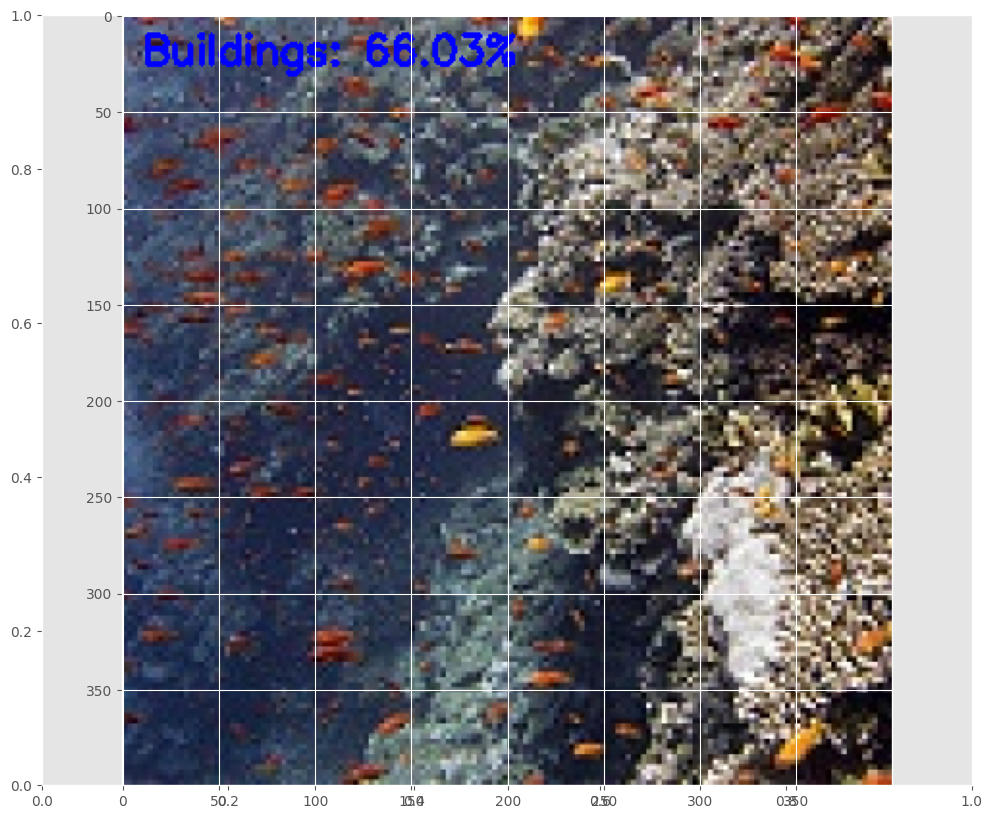

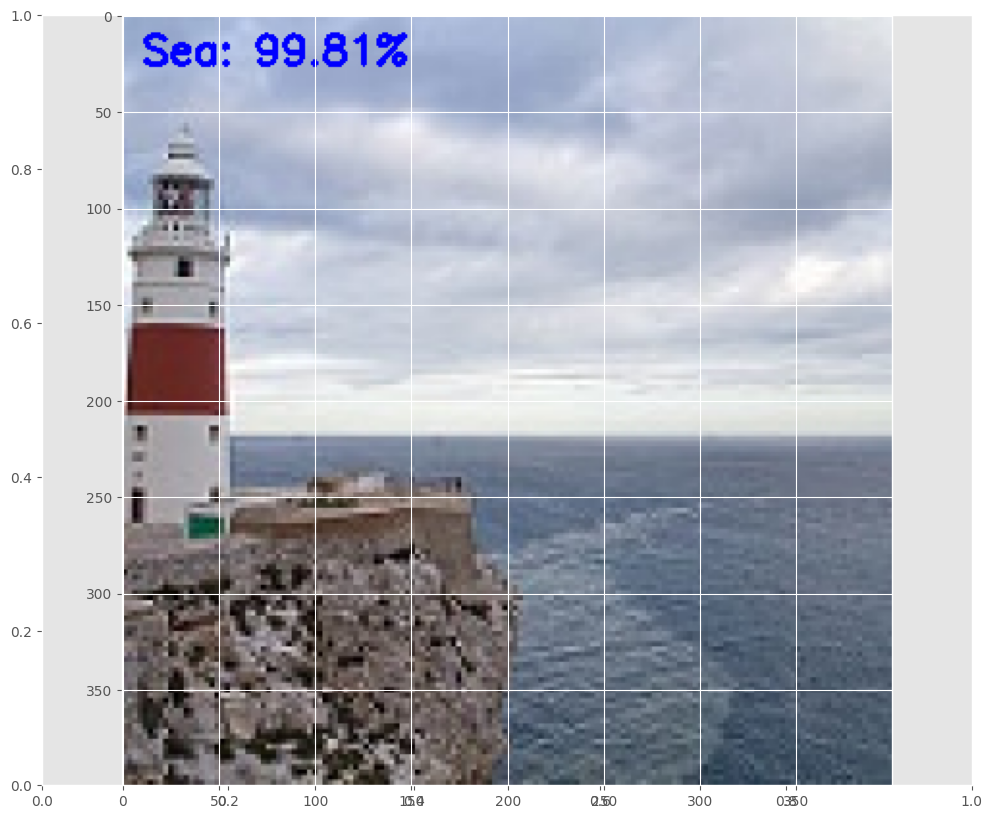

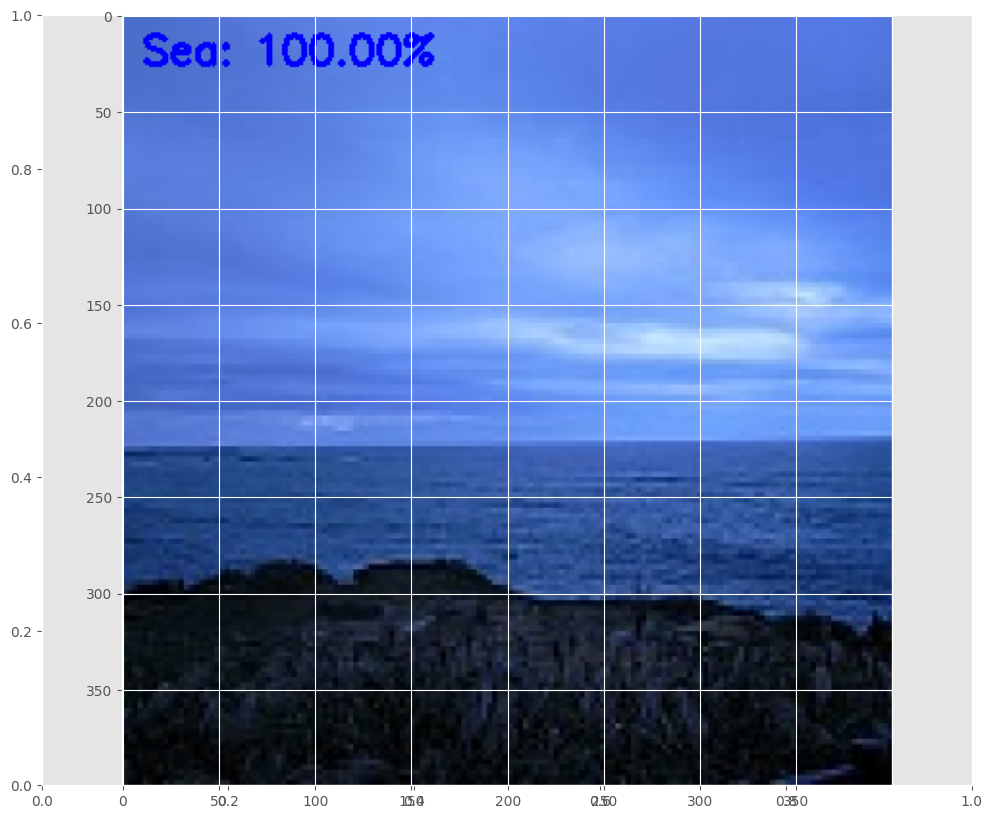

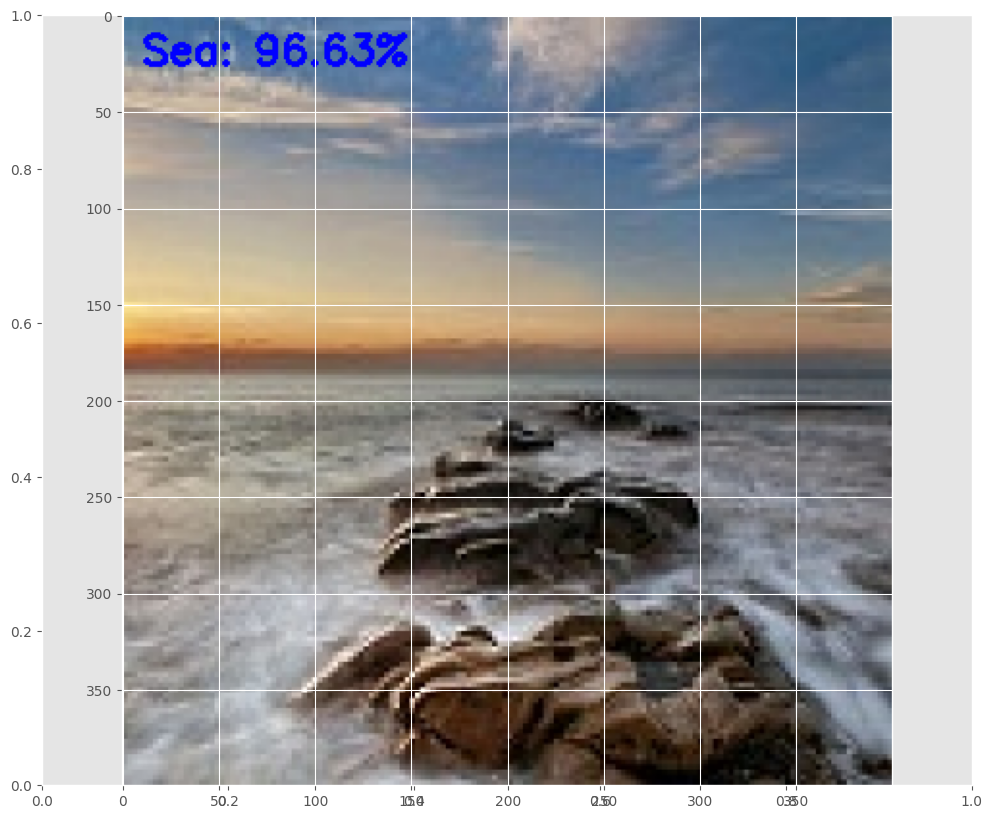

...

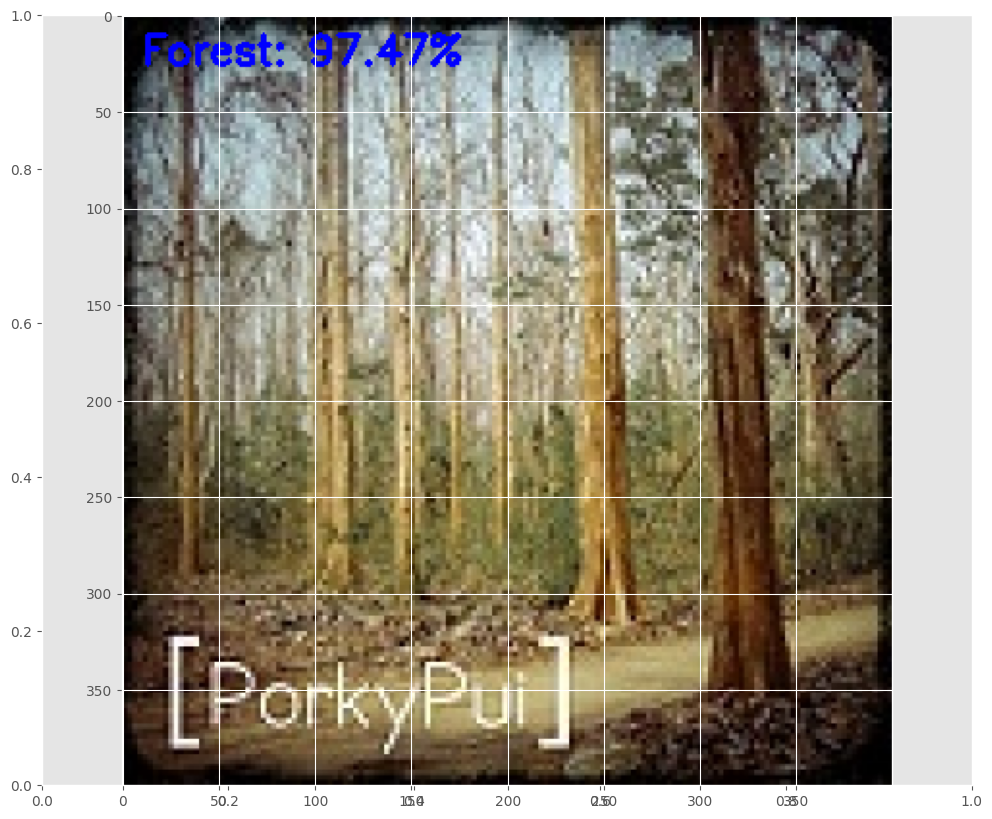

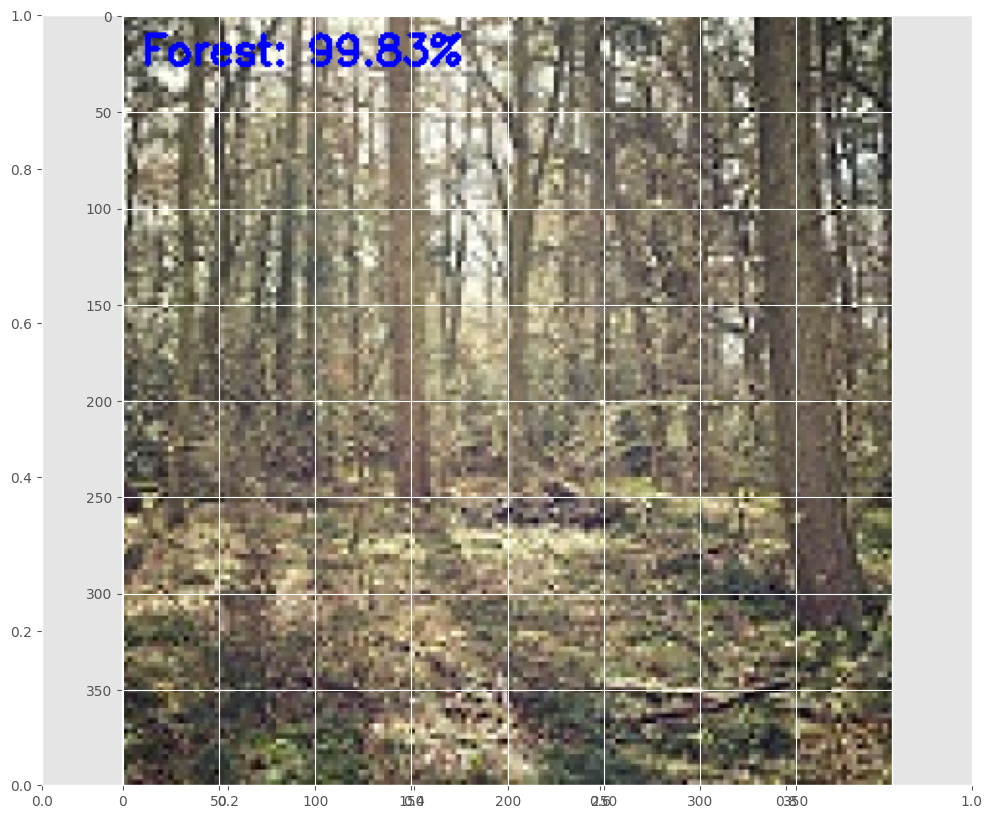

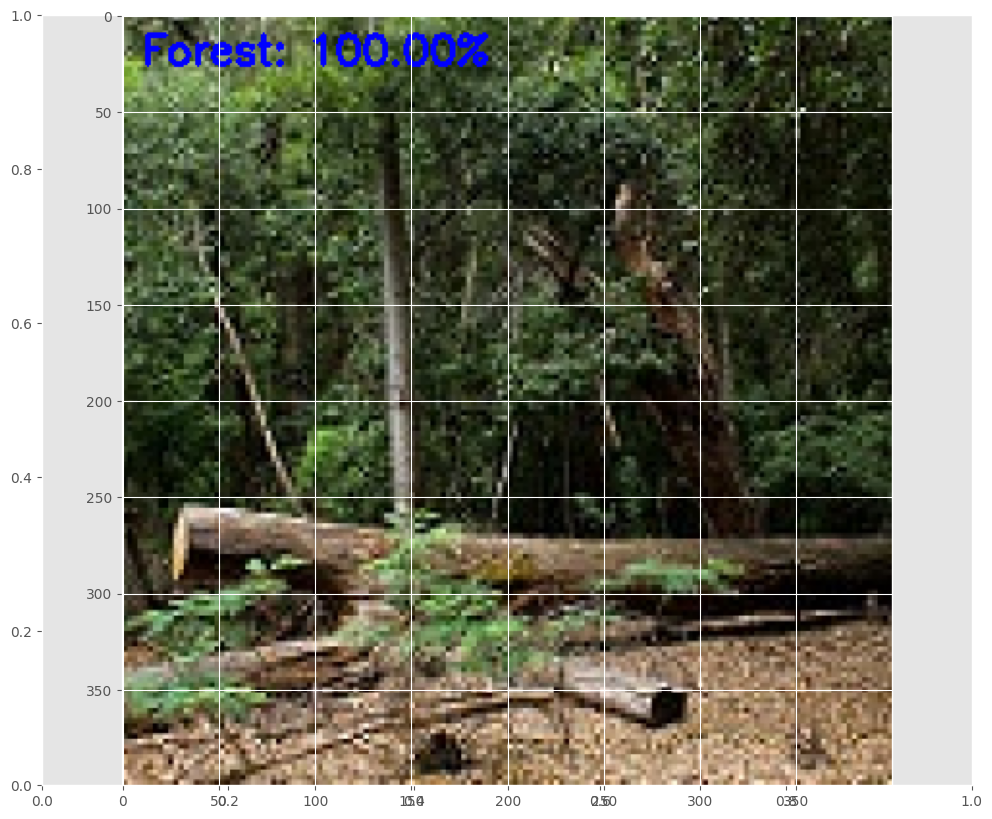

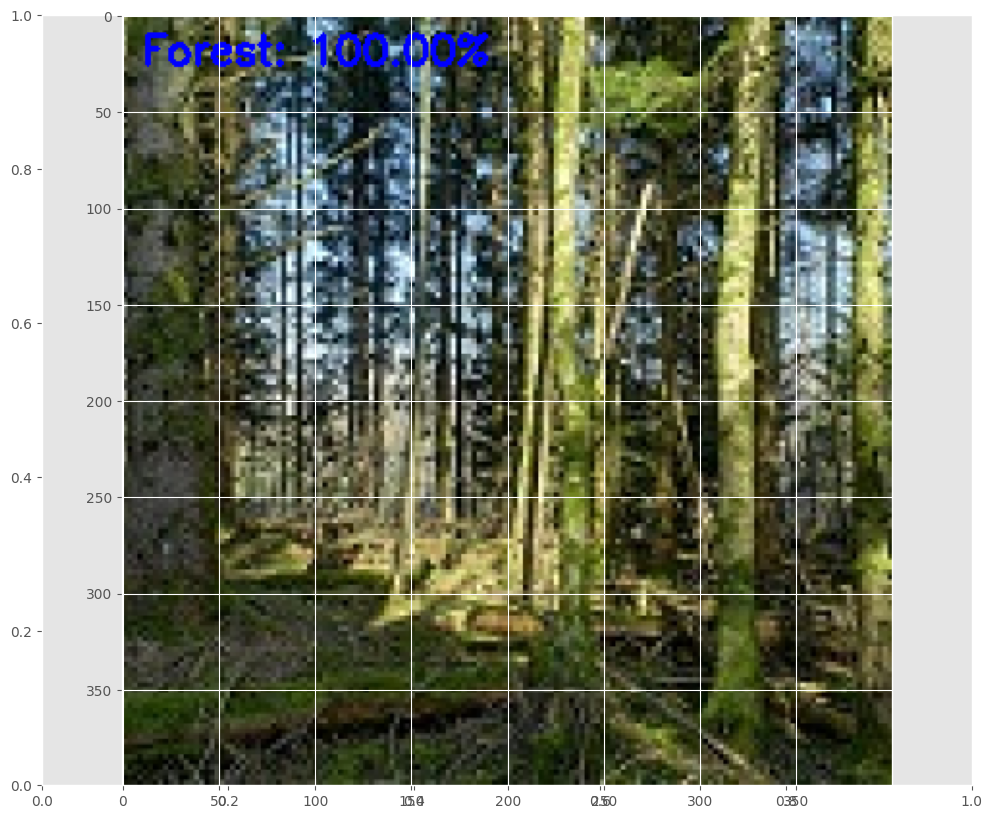

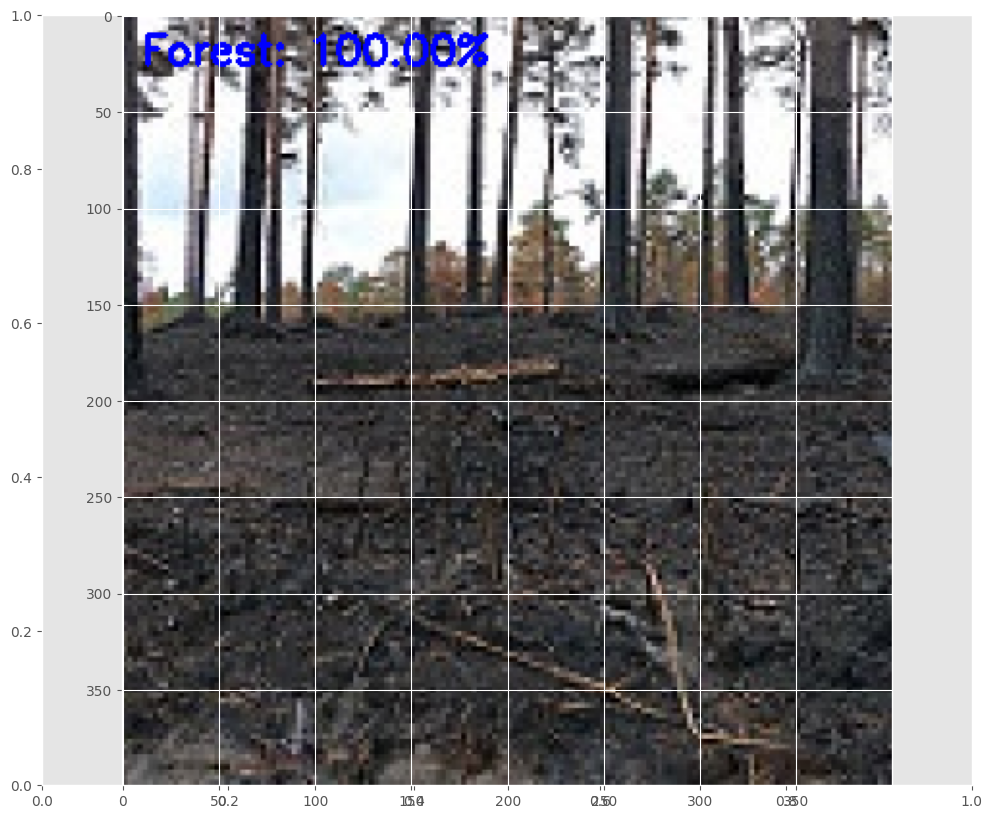

In [ ]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2

# # load the model
print("[INFO] loading network and...")
#model = load_model(MODEL)
model = load_model("/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/Scene_New.model")
# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('/content/drive/MyDrive/Data Science/Deep Learning/CNN/Dataset/CNN_test_examples')))   # data folder with 2 categorical folders

all_class = ["Buildings", "Forest", "Sea"]


# progress bar
with tqdm(total=len(testImagePaths)) as pbar:

    for imagePath in testImagePaths:

        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (28, 28))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf = model.predict(image)[0]

        # build the label
        label = all_class[np.argmax(prd_conf)]
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 0, 0), 2)

        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)

        pbar.update(1)


In [ ]:
pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 40.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.4/288.4 kB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.4/75.4 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.0/137.0 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 k

In [ ]:
import gradio as gr

In [ ]:
def predict_image(image):
    # load the image

    # pre-process the image for classification
    image = cv2.resize(image, (28, 28))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)


    preds = model.predict(image)[0]
    result = dict()
    result["Buildings"] = round(float(list(preds)[0]), 3)
    result["Forest"] = round(float(list(preds)[1]), 3)
    result["Sea"] = round(float(list(preds)[2]), 3)

    print(result)

    return result

In [ ]:
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo").launch(share=True)

In [ ]:
import tensorflow as tf
print(tf.__version__)

2.8.2
